# Info
Purpose:

    To quantify the 4STARB azimuth angle dependence
    Made from measuremneets by Steve B. during August 2021. 
    Hand movements of 4STARB near solar noon.

Input:

    None

Output:

    Figure and save files

Keywords:

    none

Dependencies:

    - load_utils.py
    - matplotlib
    - numpy
    - write_utils
    - path_utils
    - hdf5storage
    - scipy

Needed Files:
  - file.rc : for consistent creation of look of matplotlib figures
  - starsun for each of the 2021-08 measurement days

Modification History:

    Written: Samuel LeBlanc, Santa Cruz, CA, 2022-02-24
    Modified:


# Prepare python environment

In [3]:
import numpy as np
import load_utils as lu
import write_utils as wu
from path_utils import getpath
import hdf5storage as hs
import scipy.io as sio
import matplotlib.pyplot as plt
%matplotlib notebook
import os


In [5]:
name = 'rooftop'
vv = 'v1'
fp = getpath(name)
fpo = fp+'Summer_2021/'
fps = fpo+'data_processed/starsuns/'

Return path named:  rooftop /data/sunsat/rooftop/


# Load files

In [22]:
days = ['20210809','20210811','20210813','20210816','20210817','20210823']
dat = {}
for k in days:
    print(k)
    s = hs.loadmat(fps+'4STARB_{}starsun.mat'.format(k),variable_names=['tau_aero','t','AZ_deg','rate','w'])
    dat[k] = {'t':s['t'],'tau':s['tau_aero'],'azi':s['AZ_deg'],'rate':s['rate'],'time':lu.mat2py_time(s['t'])}
wave = s['w']

20210809
20210811
20210813
20210816
20210817
20210823


In [74]:
time_lims = {'20210809':[20.7,21.1],'20210811':[20.0,20.35],'20210813':[19.75,20.4],
             '20210816':[19.8,20.55],'20210817':[20.0,20.3],'20210823':[20.2,20.45]}
#aod_lims = {'20210809':[-0.15,0.25],'20210811':[-0.15,0.25],'20210813':[-0.15,0.25],
#            '20210816':[-0.15,0.25],'20210817':[-0.15,0.25],'20210823':[-0.15,0.25]}
aod_lims = [[0.12,0.5], #350
            [0.08,0.35], #470
            [0.07,0.3], #500
            [0.04,0.2], #675
            [0.04,0.16], #850
            [-0.15,0.15], #950
            [0.05,0.15], #1020
            [0.06,0.14], #1240
            [0.06,0.14]] #1640

# Plot out data

In [24]:
for k in days:
    dat[k]['utc'] = np.array([t.hour+t.minute/60.0+t.second/3600.0 for t in dat[k]['time']])

In [25]:
dat['20210809']['tau'].shape

(20735, 1556)

In [82]:
from scipy.interpolate import UnivariateSpline
def interp_spline(xold, yold, ynew):
    uv = UnivariateSpline(xold,yold,ext=0,k=3)
    return uv(ynew)

## plot AOD vs azimuth

<IPython.core.display.Javascript object>


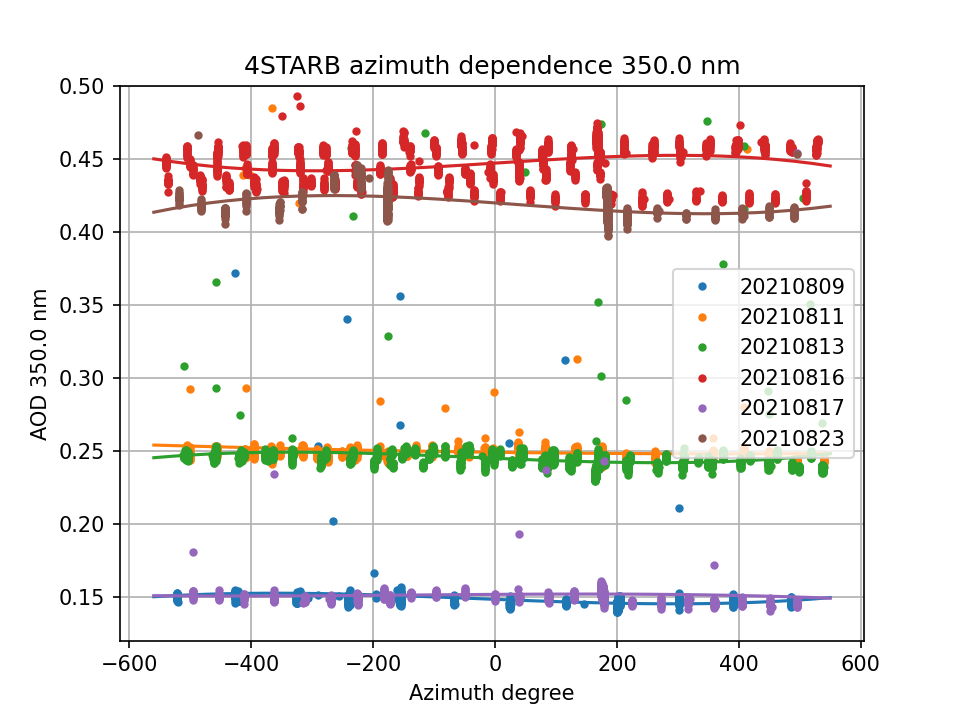

220 350.0


<IPython.core.display.Javascript object>


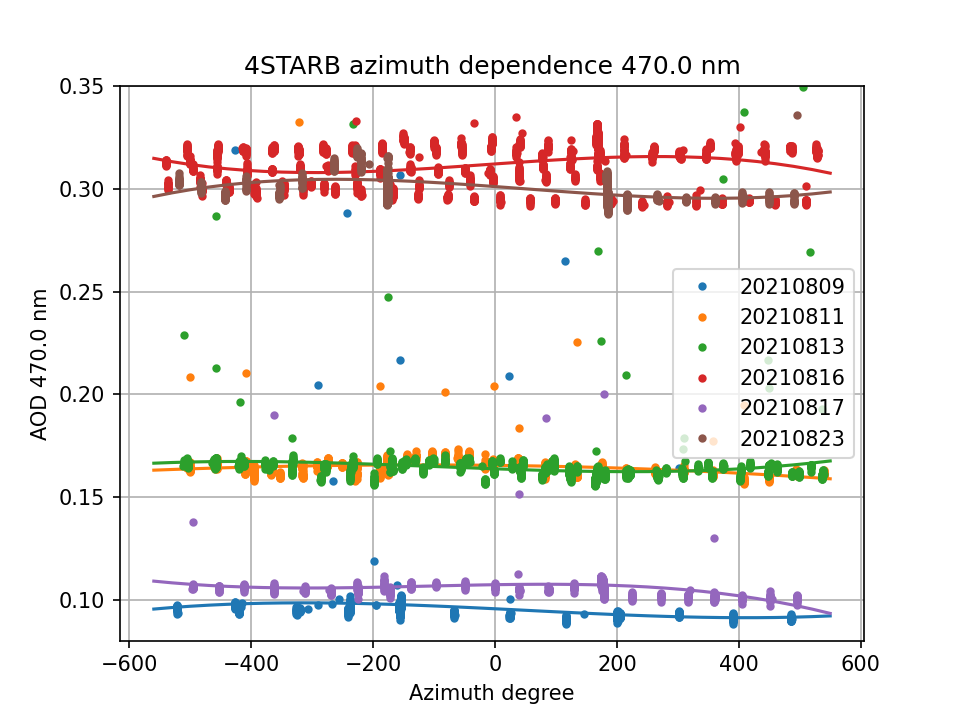

368 470.0


<IPython.core.display.Javascript object>


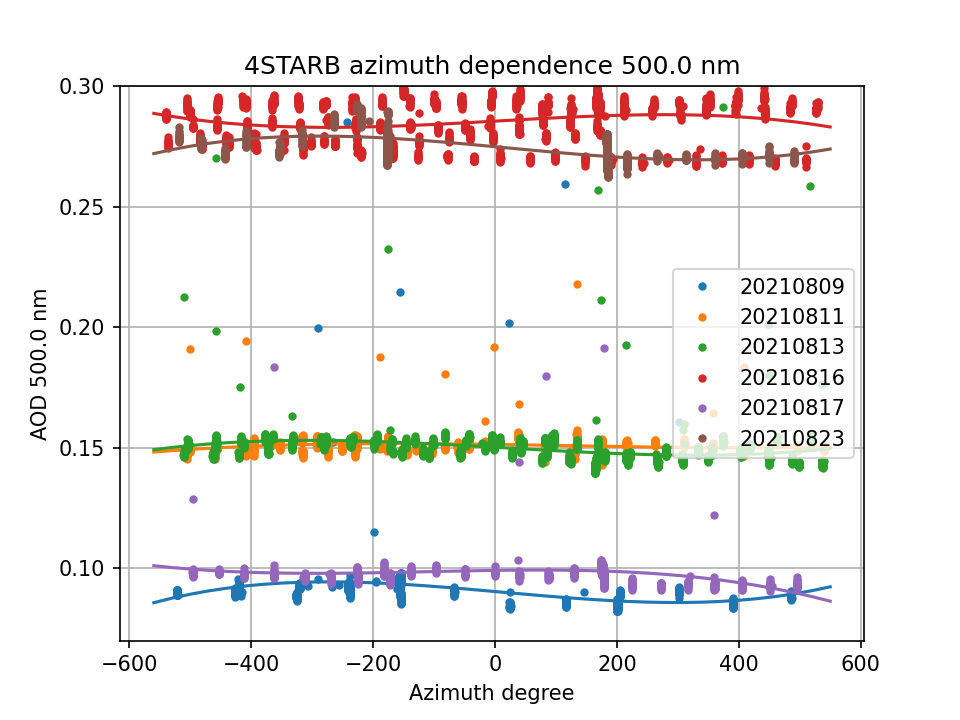

406 500.0


<IPython.core.display.Javascript object>


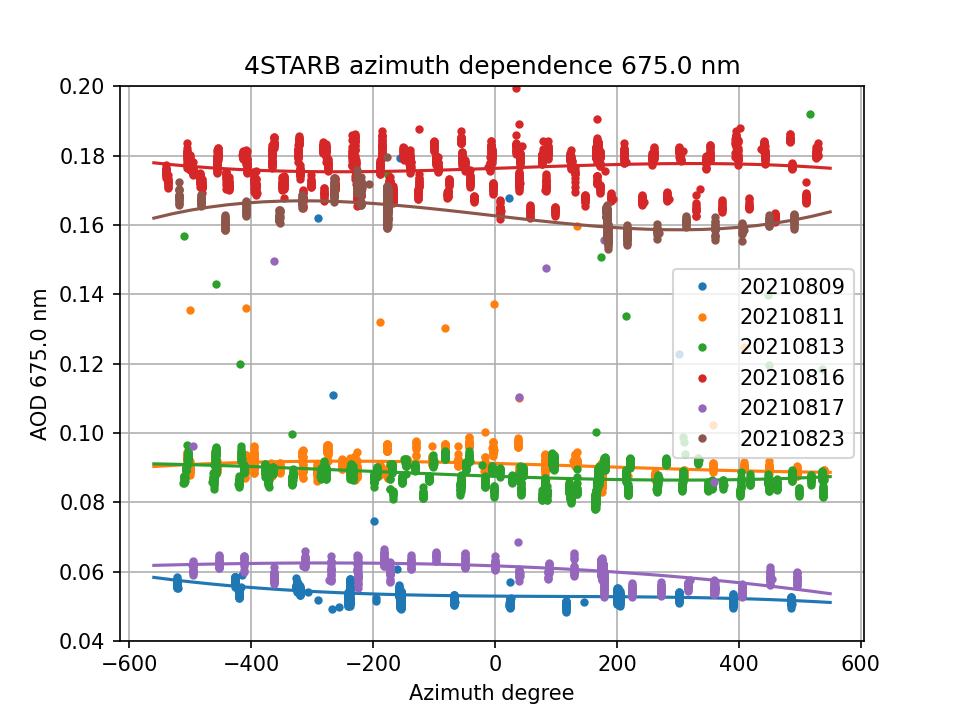

625 675.0


<IPython.core.display.Javascript object>


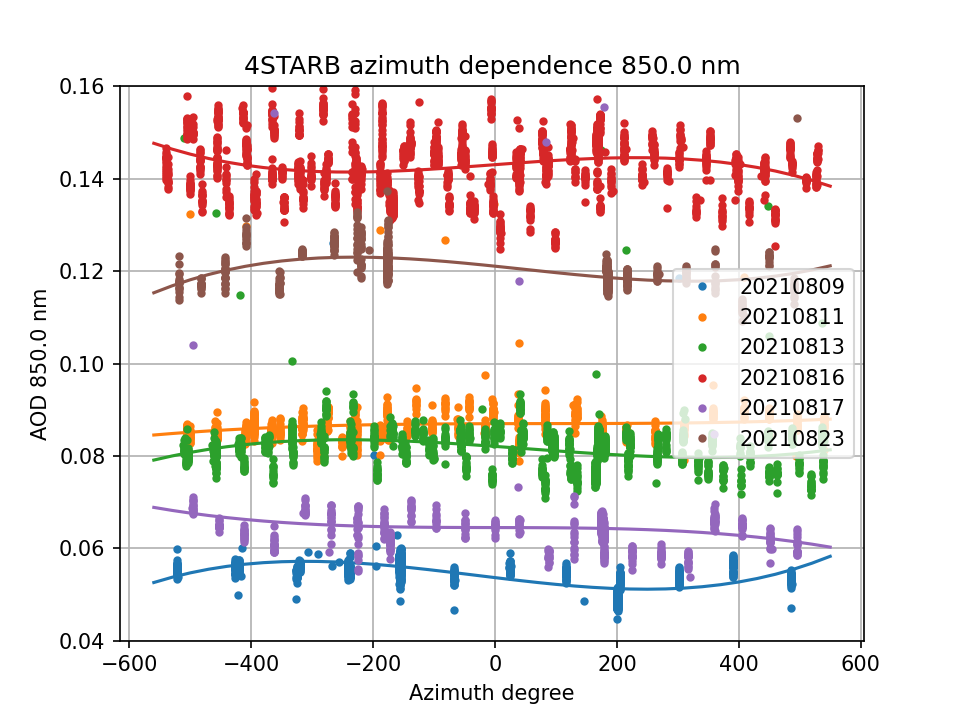

848 850.0


<IPython.core.display.Javascript object>


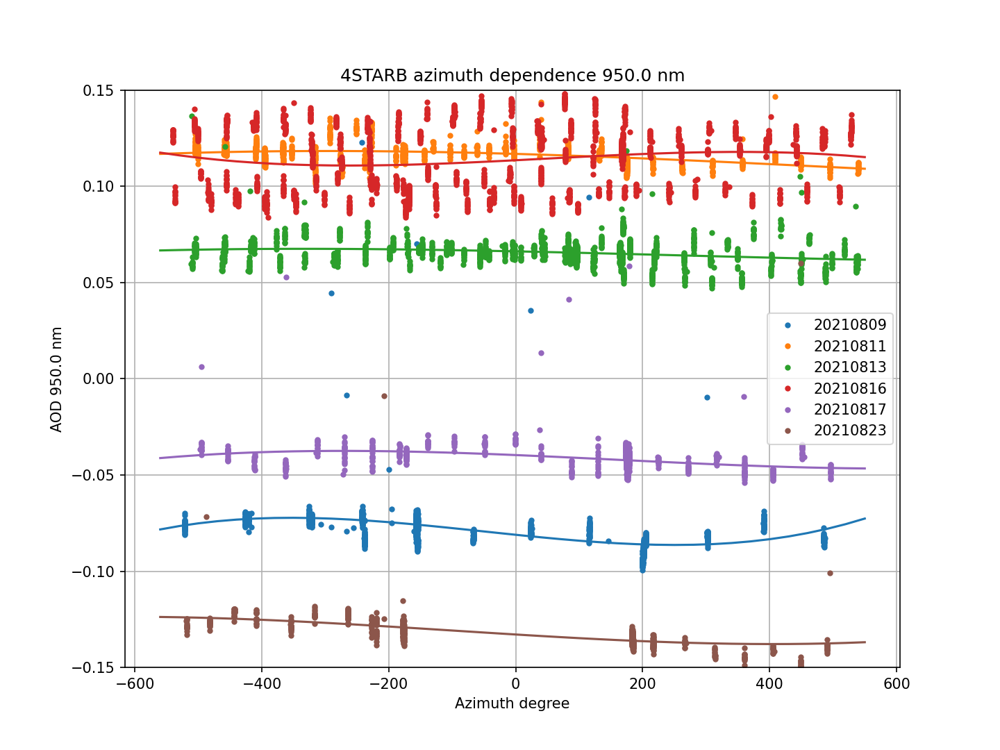

978 950.0


<IPython.core.display.Javascript object>


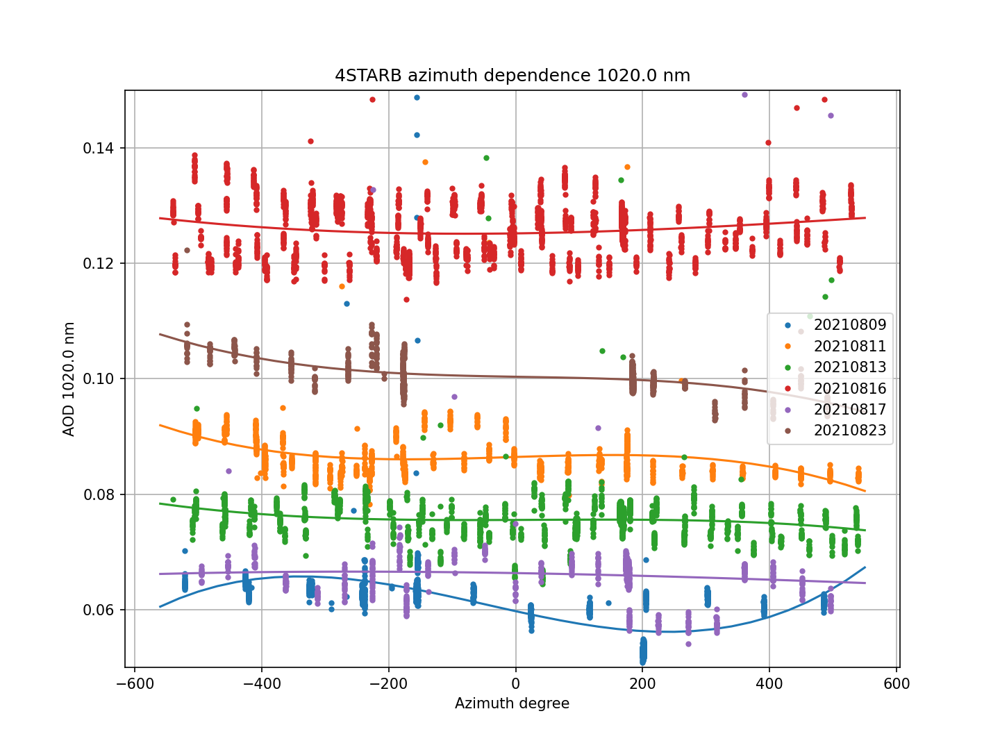

1084 1020.0


<IPython.core.display.Javascript object>


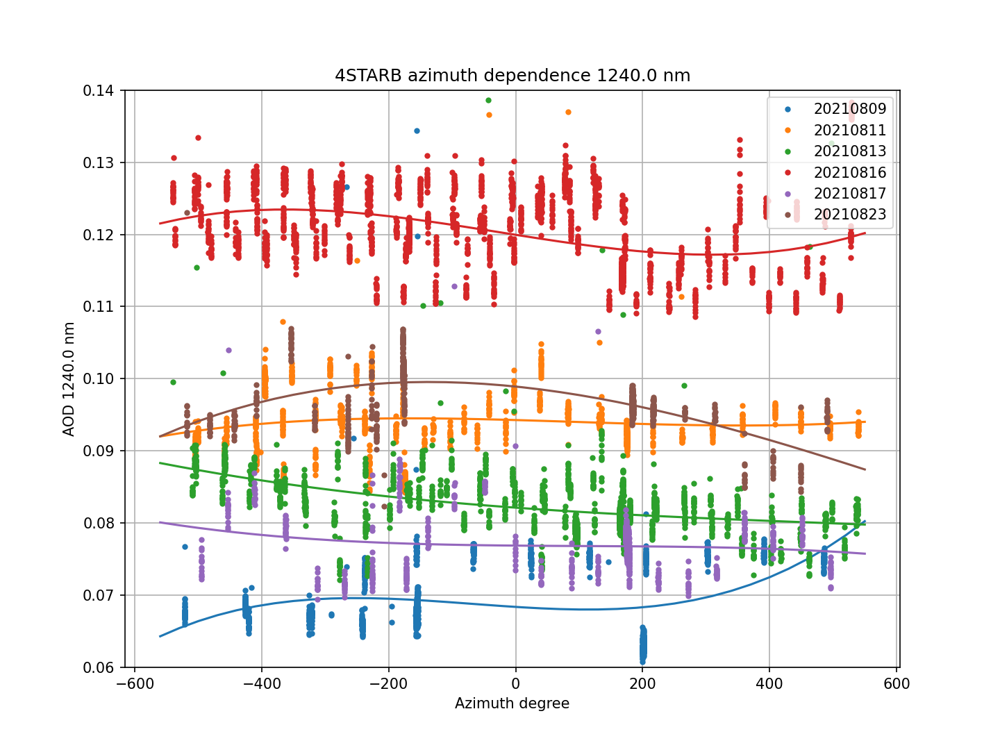

1216 1240.0


<IPython.core.display.Javascript object>


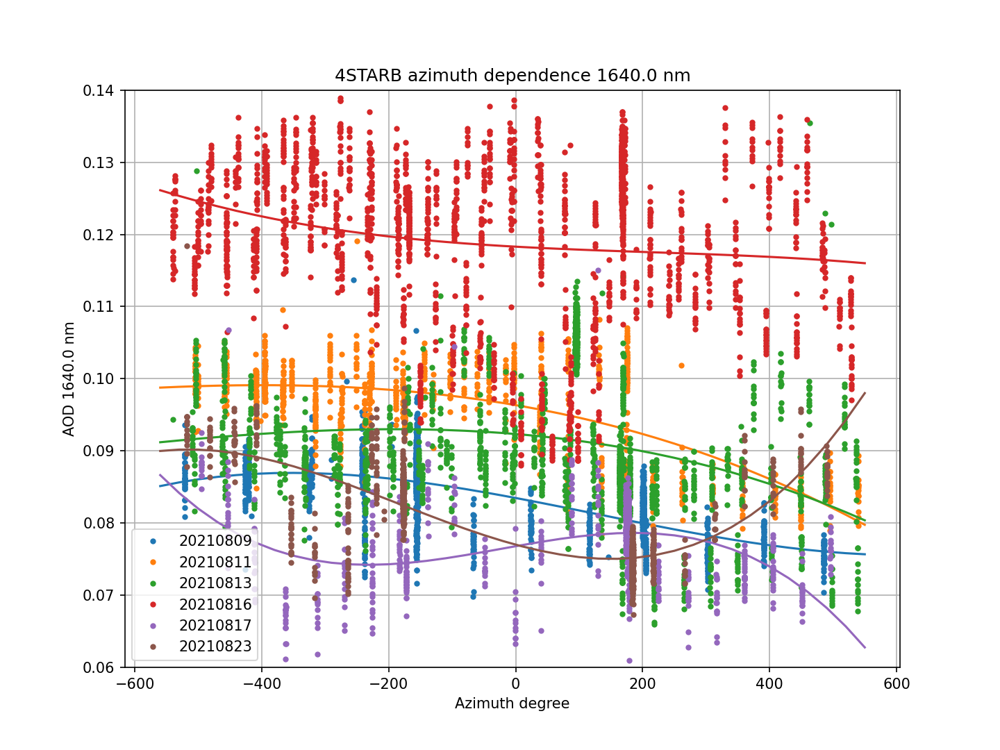

1505 1640.0


In [83]:
az = np.arange(-560,560,30)
for i,wvl in enumerate([350.0,470.0,500.0,675.0,850.0,950.0,1020.0,1240.0,1640.0]):
    plt.figure()
    iw = np.argmin(abs(wave-wvl/1000.0))
    print(iw,wvl)
    for k in days:
        flt = (dat[k]['utc']>time_lims[k][0]) & (dat[k]['utc']<time_lims[k][1]) & (np.isfinite(dat[k]['tau'][:,iw])) \
            & (dat[k]['tau'][:,iw]>aod_lims[i][0])  & (dat[k]['tau'][:,iw]<aod_lims[i][1])
        p = plt.plot(dat[k]['azi'][flt],dat[k]['tau'][flt,iw],'.',label=k)
        plt.plot(az,interp_spline(dat[k]['azi'][flt],dat[k]['tau'][flt,iw],az),'-',c=p[0].get_c())
    plt.xlabel('Azimuth degree')
    plt.ylabel('AOD {:3.1f} nm'.format(wvl))
    plt.ylim(aod_lims[i])
    plt.legend(frameon=True)
    plt.title('4STARB azimuth dependence {:4.1f} nm'.format(wvl)) 
    plt.grid()
    plt.savefig(fpo+'plots/4STARB_AOD_AZIMUTH_{:04.0f}.png'.format(wvl),dpi=600,transparent=True)

## Ratio of AOD to the mean (as percentage)

<IPython.core.display.Javascript object>


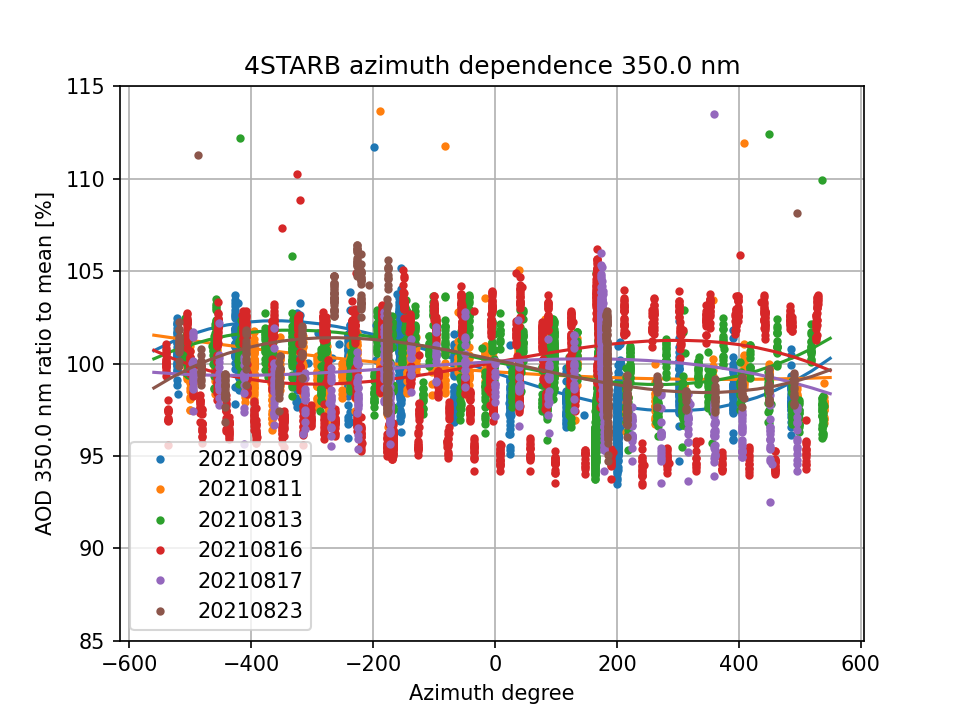

220 350.0


<IPython.core.display.Javascript object>


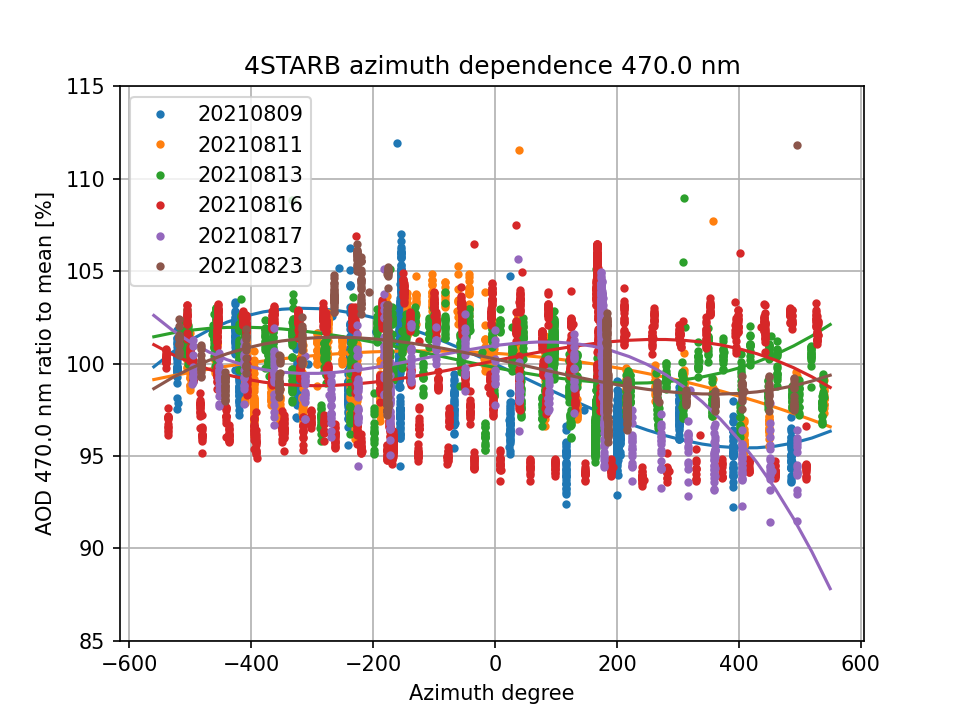

368 470.0


<IPython.core.display.Javascript object>


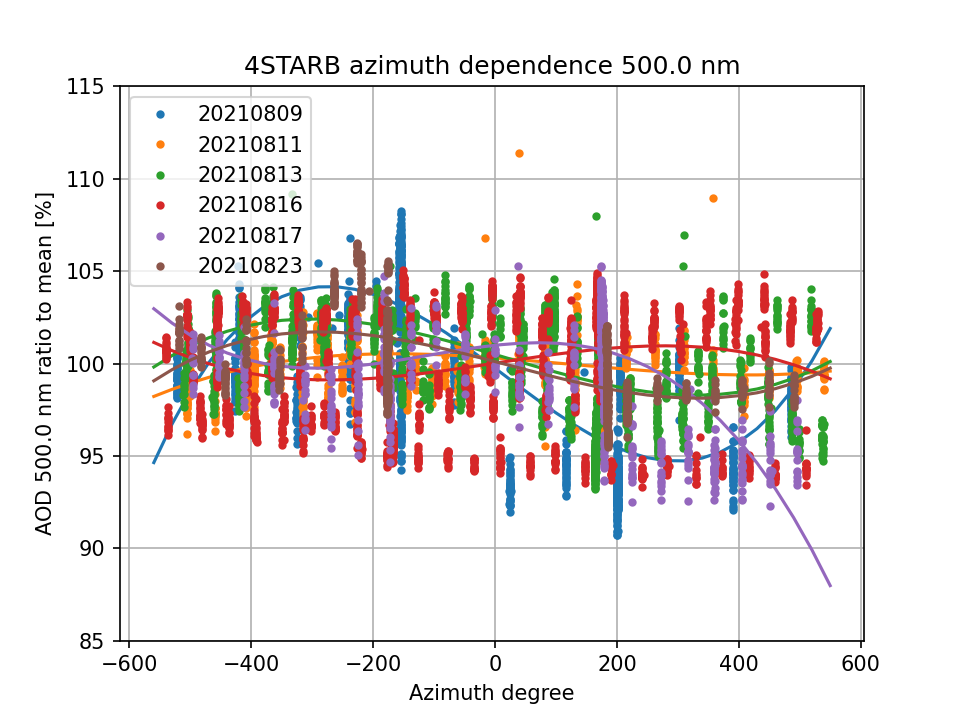

406 500.0


<IPython.core.display.Javascript object>


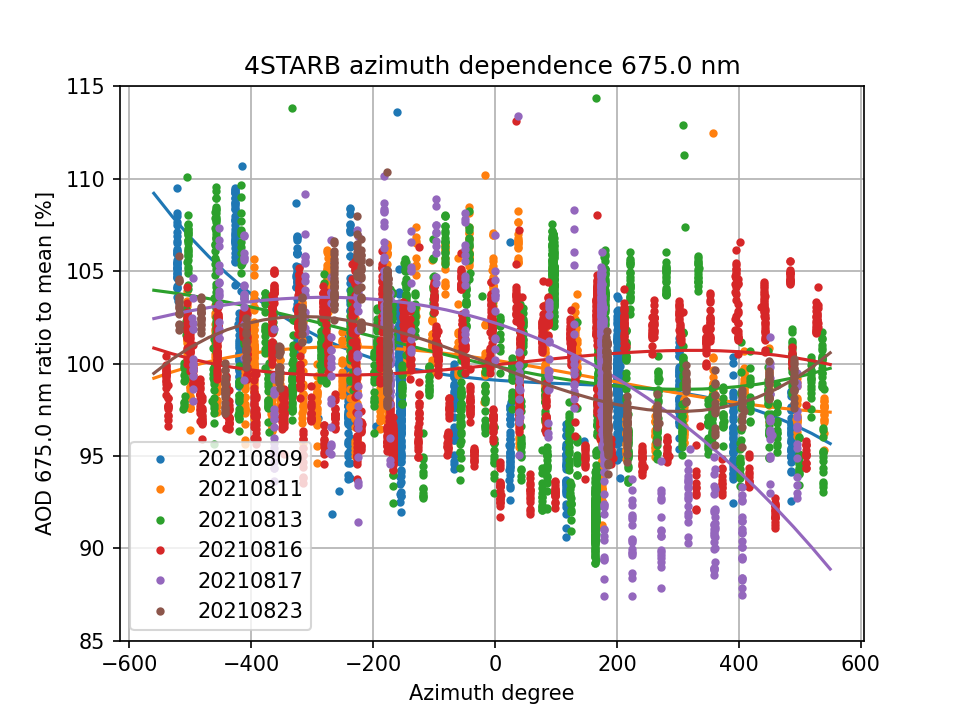

625 675.0


<IPython.core.display.Javascript object>


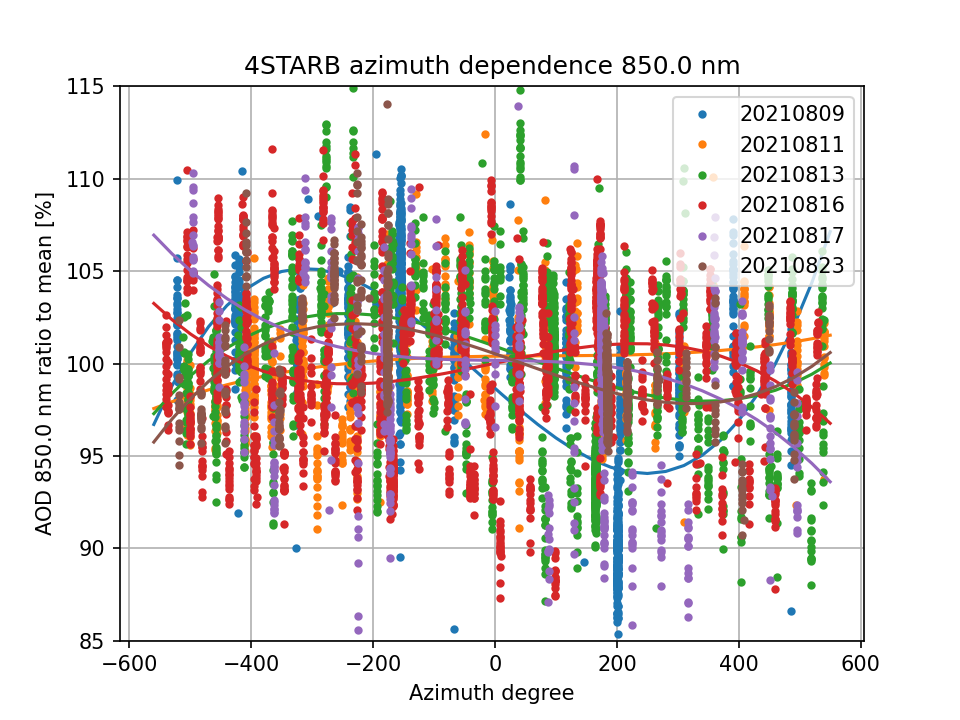

848 850.0


<IPython.core.display.Javascript object>


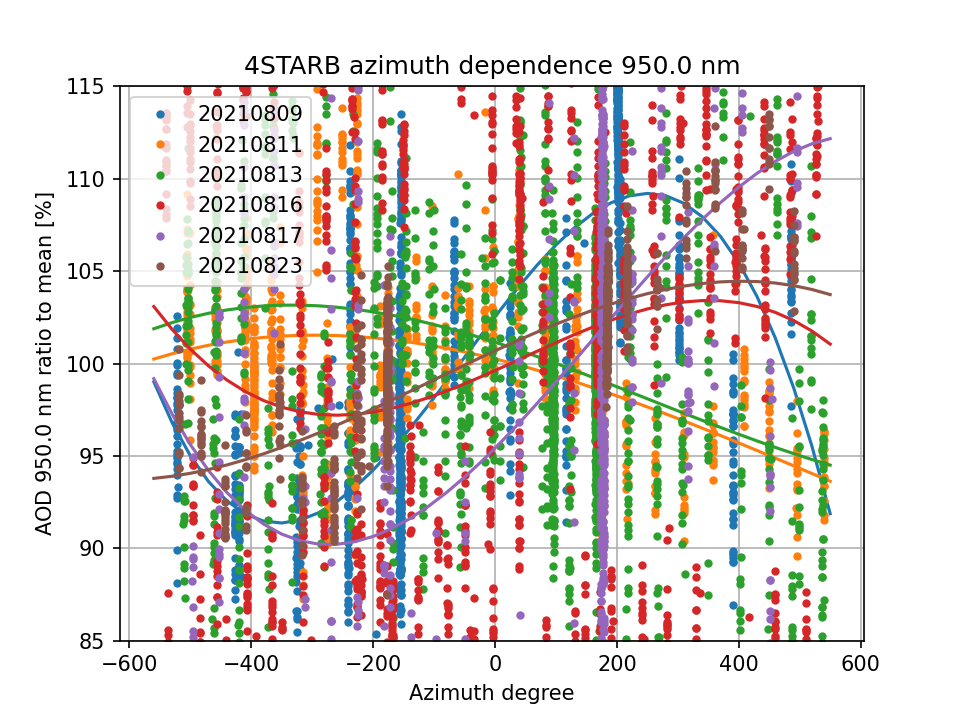

978 950.0


<IPython.core.display.Javascript object>


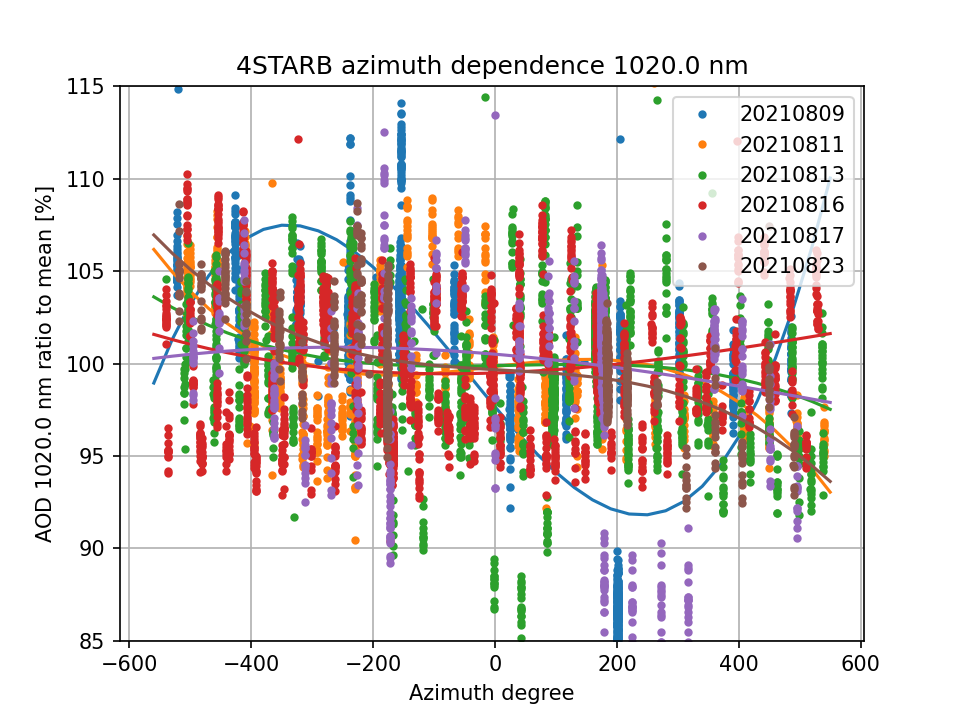

1084 1020.0


<IPython.core.display.Javascript object>


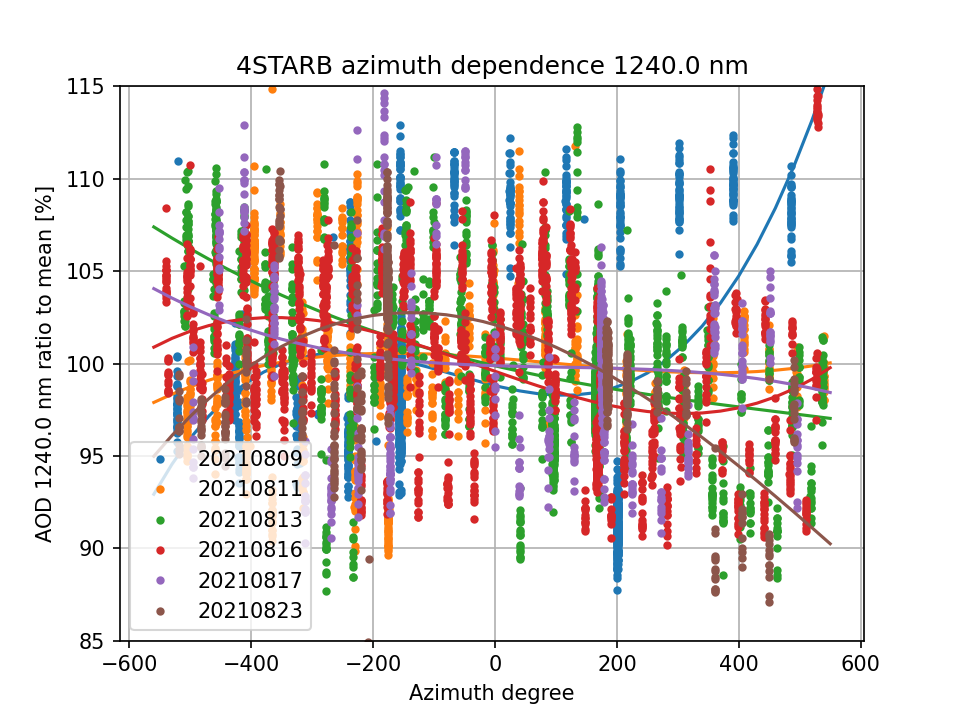

1216 1240.0


<IPython.core.display.Javascript object>


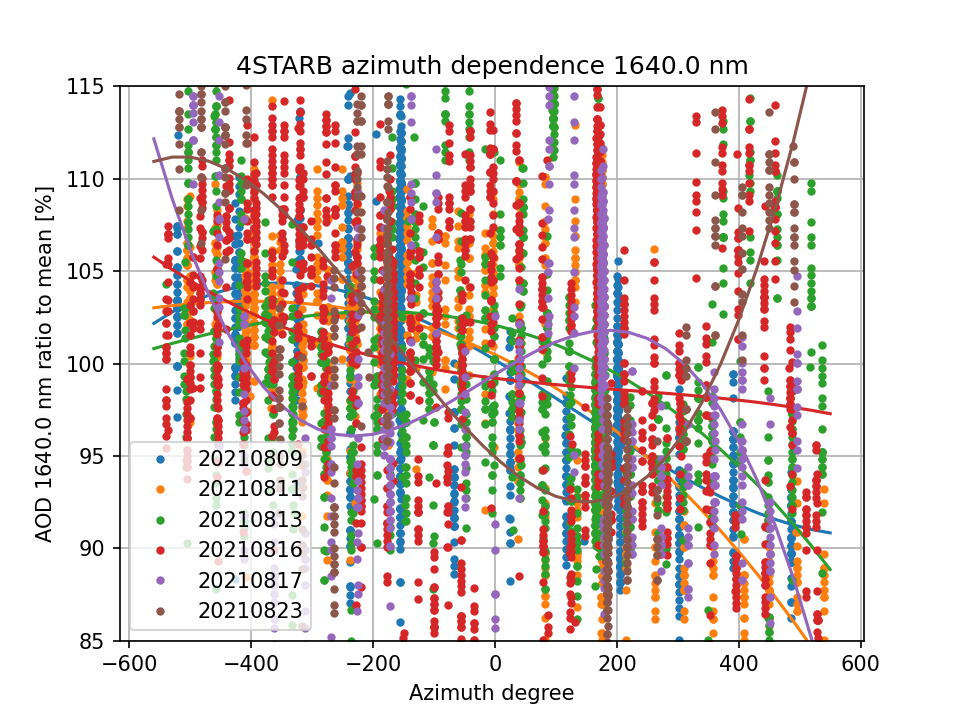

1505 1640.0


In [91]:
az = np.arange(-560,560,30)
for i,wvl in enumerate([350.0,470.0,500.0,675.0,850.0,950.0,1020.0,1240.0,1640.0]):
    plt.figure()
    iw = np.argmin(abs(wave-wvl/1000.0))
    print(iw,wvl)
    for k in days:
        flt = (dat[k]['utc']>time_lims[k][0]) & (dat[k]['utc']<time_lims[k][1]) & (np.isfinite(dat[k]['tau'][:,iw])) \
            & (dat[k]['tau'][:,iw]>aod_lims[i][0])  & (dat[k]['tau'][:,iw]<aod_lims[i][1])
        aod_m = np.nanmean(dat[k]['tau'][flt,iw])
        p = plt.plot(dat[k]['azi'][flt],dat[k]['tau'][flt,iw]/aod_m*100.0,'.',label=k)
        plt.plot(az,interp_spline(dat[k]['azi'][flt],dat[k]['tau'][flt,iw],az)/aod_m*100.0,'-',c=p[0].get_c())
    plt.xlabel('Azimuth degree')
    plt.ylabel('AOD {:3.1f} nm ratio to mean [$\%$]'.format(wvl))
    plt.ylim([85,115])
    #plt.ylim(aod_lims[i])
    plt.legend(frameon=True)
    plt.title('4STARB azimuth dependence {:4.1f} nm'.format(wvl)) 
    plt.grid()
    plt.savefig(fpo+'plots/4STARB_AOD_ratio_AZIMUTH_{:04.0f}.png'.format(wvl),dpi=600,transparent=True)

## plot the rates (each wavelength will be different)

<IPython.core.display.Javascript object>


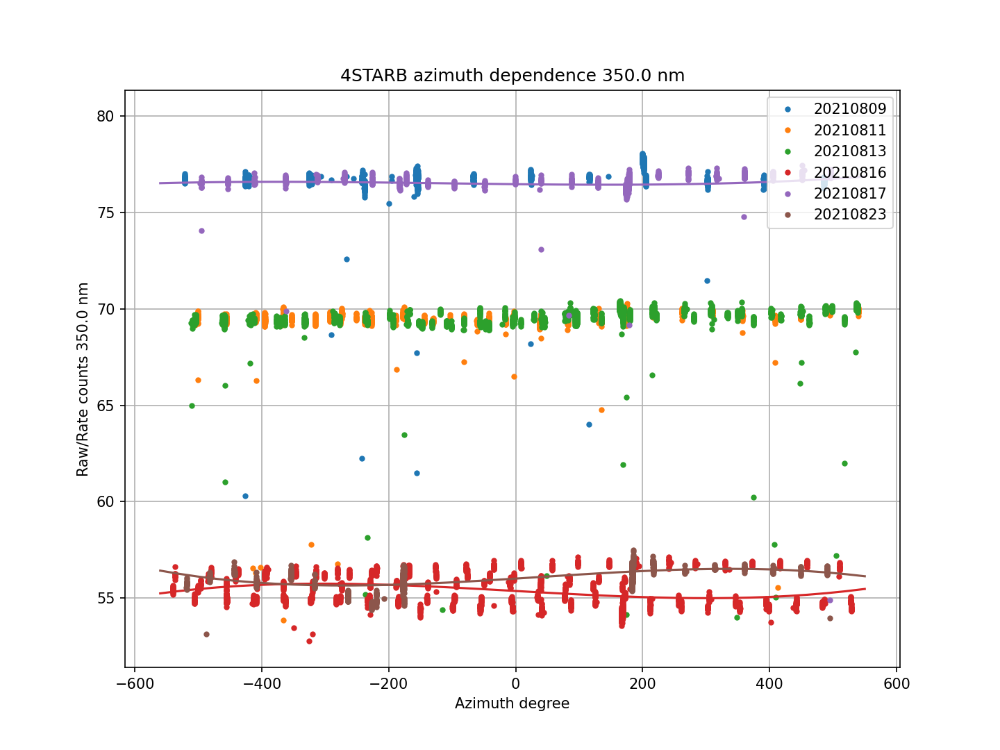

220 350.0


/home/sam/.local/lib/python3.8/site-packages/scipy/interpolate/fitpack2.py:279: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


<IPython.core.display.Javascript object>


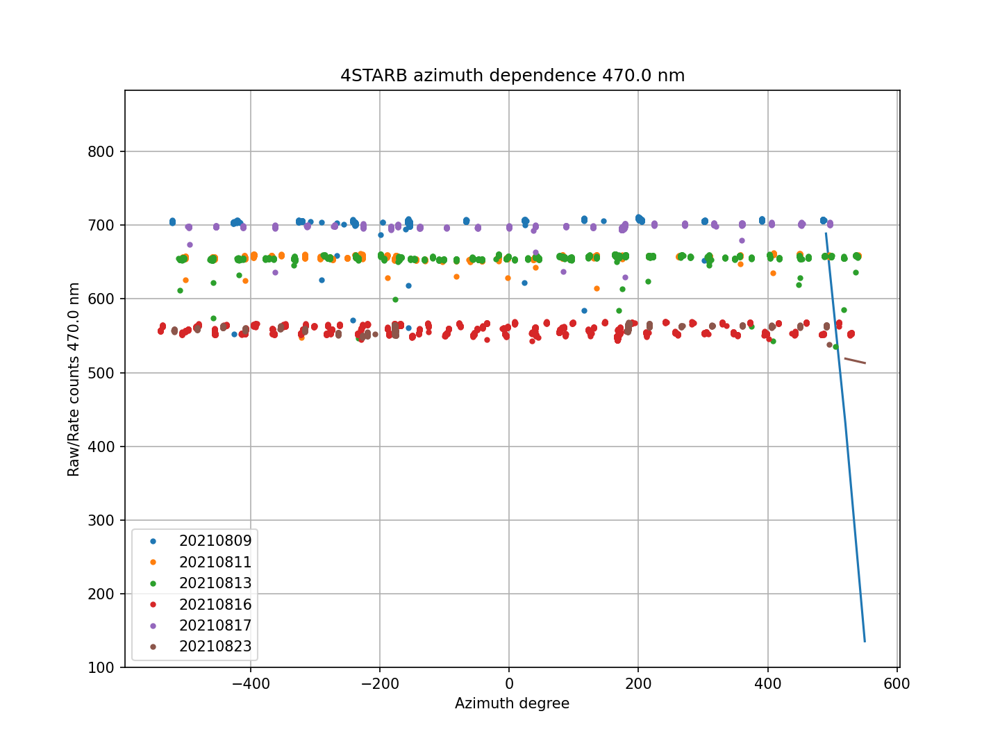

368 470.0


<IPython.core.display.Javascript object>


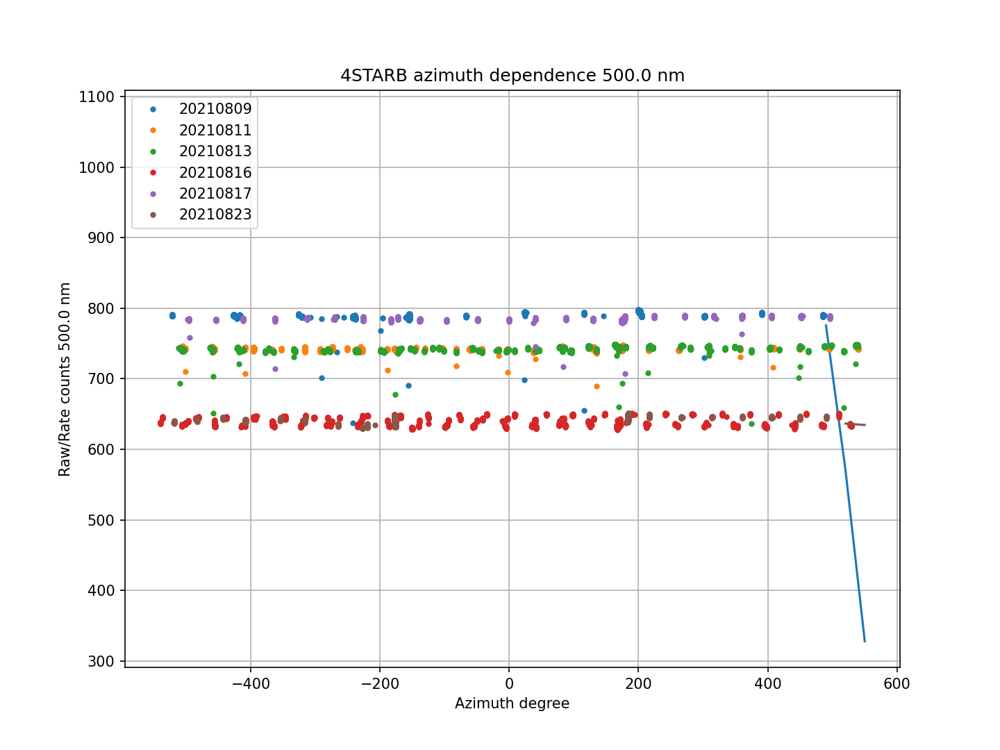

406 500.0


<IPython.core.display.Javascript object>


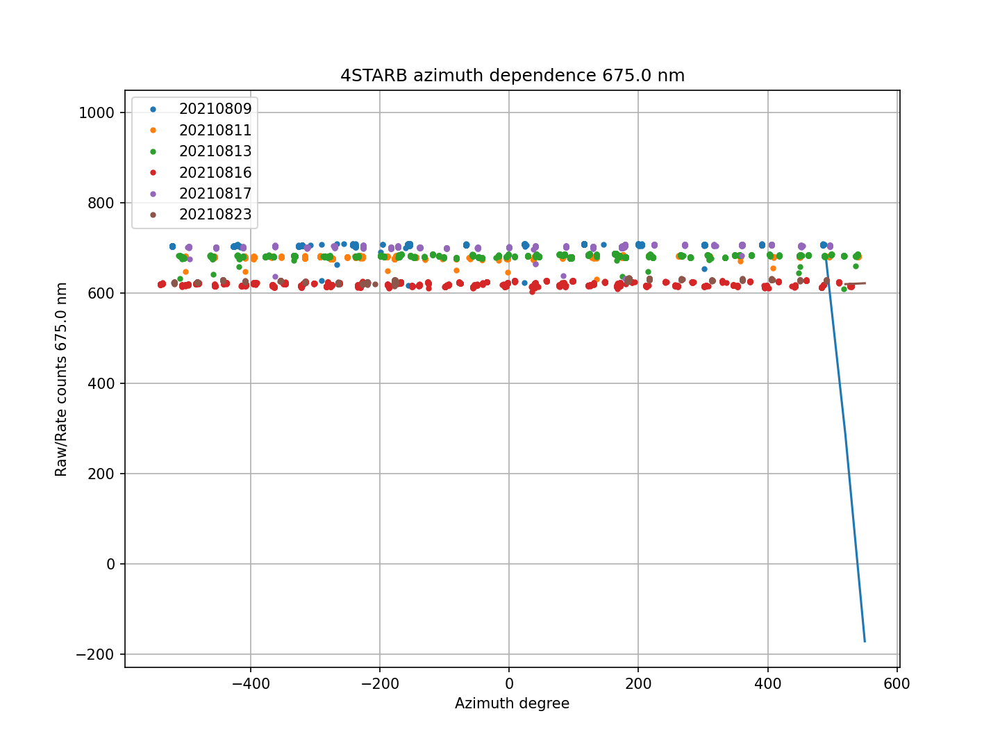

625 675.0


<IPython.core.display.Javascript object>


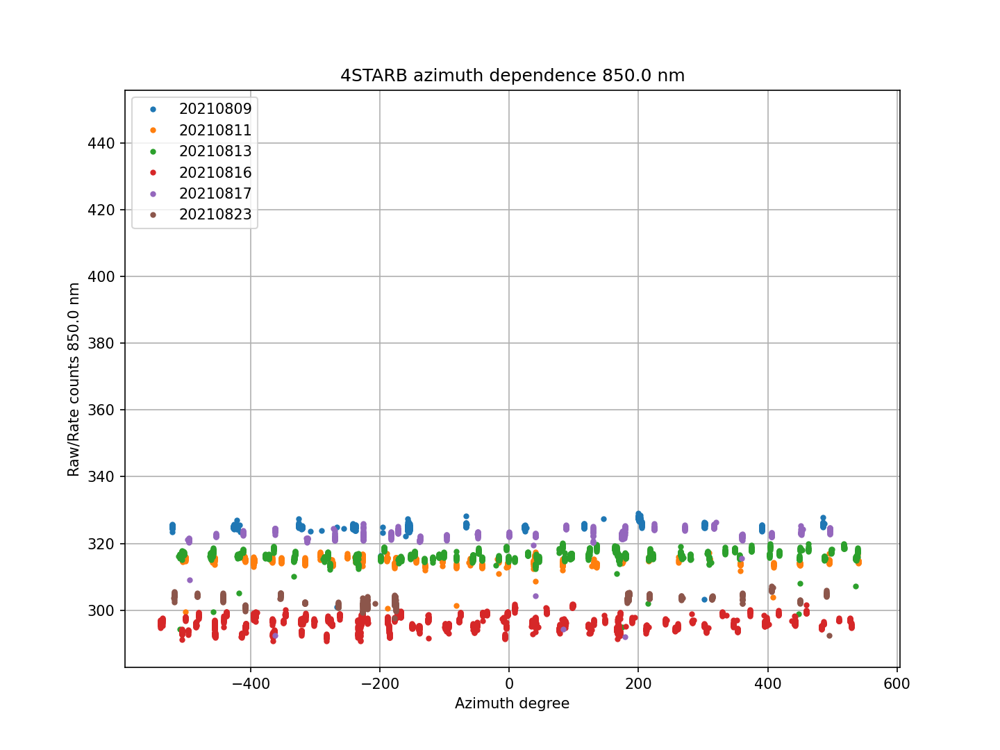

848 850.0


/home/sam/.local/lib/python3.8/site-packages/scipy/interpolate/fitpack2.py:279: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)
/home/sam/.local/lib/python3.8/site-packages/scipy/interpolate/fitpack2.py:279: UserWarning: 
The maximal number of iterations maxit (set to 20 by the program)
allowed for finding a smoothing spline with fp=s has been reached: s
too small.
There is an approximation returned but the corresponding weighted sum
of squared residuals does not satisfy the condition abs(fp-s)/s < tol.
  warnings.warn(message)


<IPython.core.display.Javascript object>


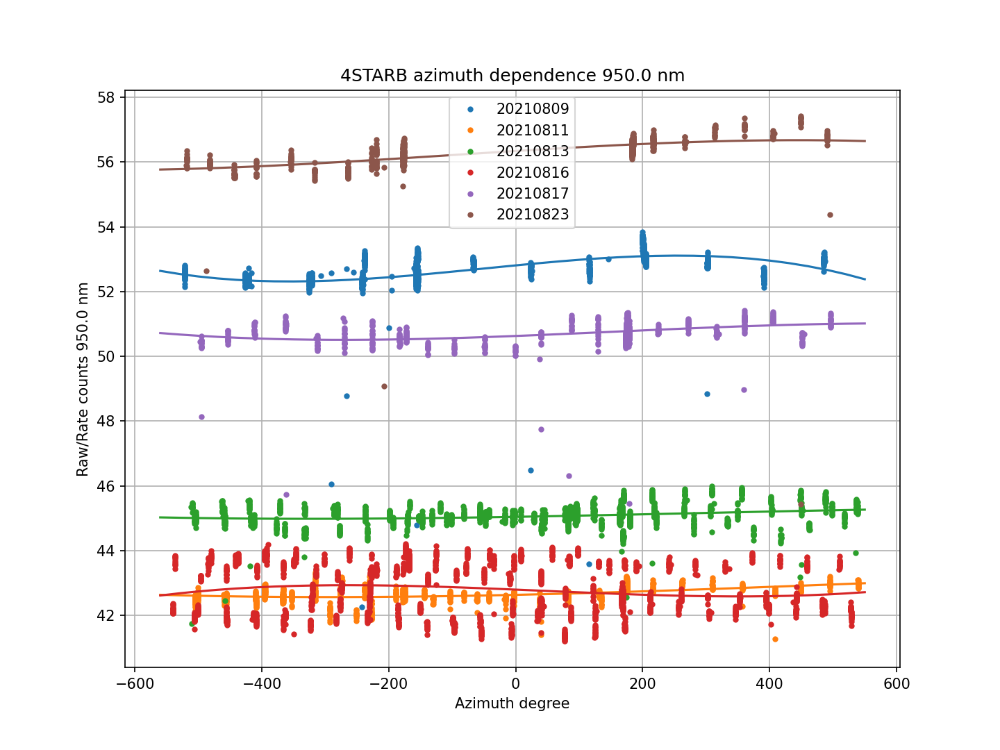

978 950.0


<IPython.core.display.Javascript object>


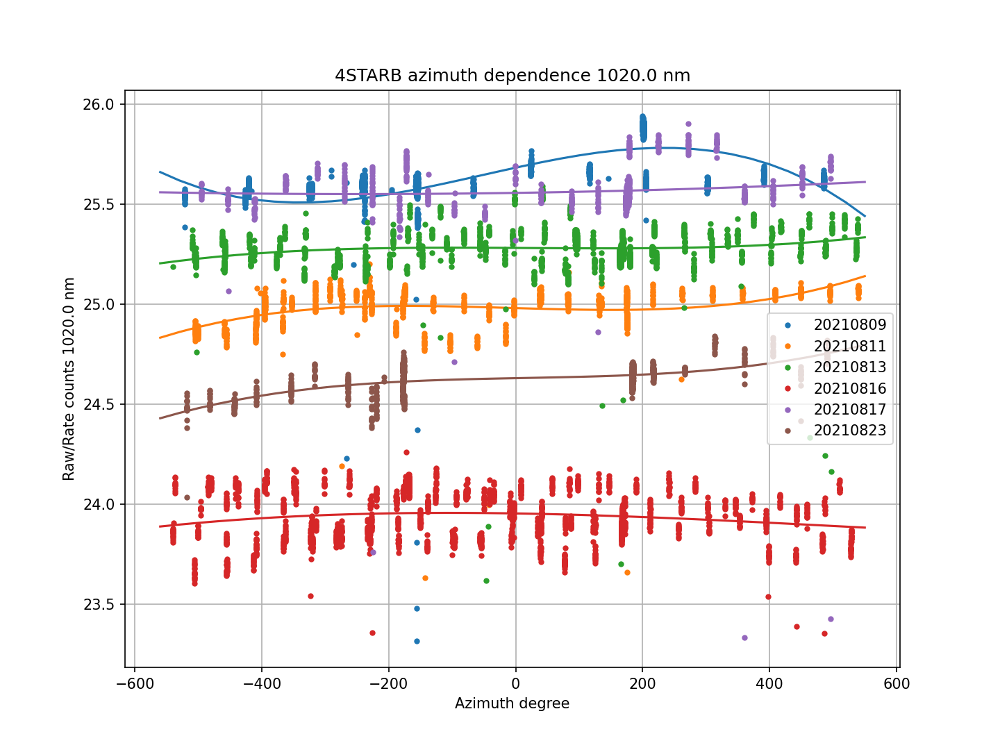

1084 1020.0


<IPython.core.display.Javascript object>


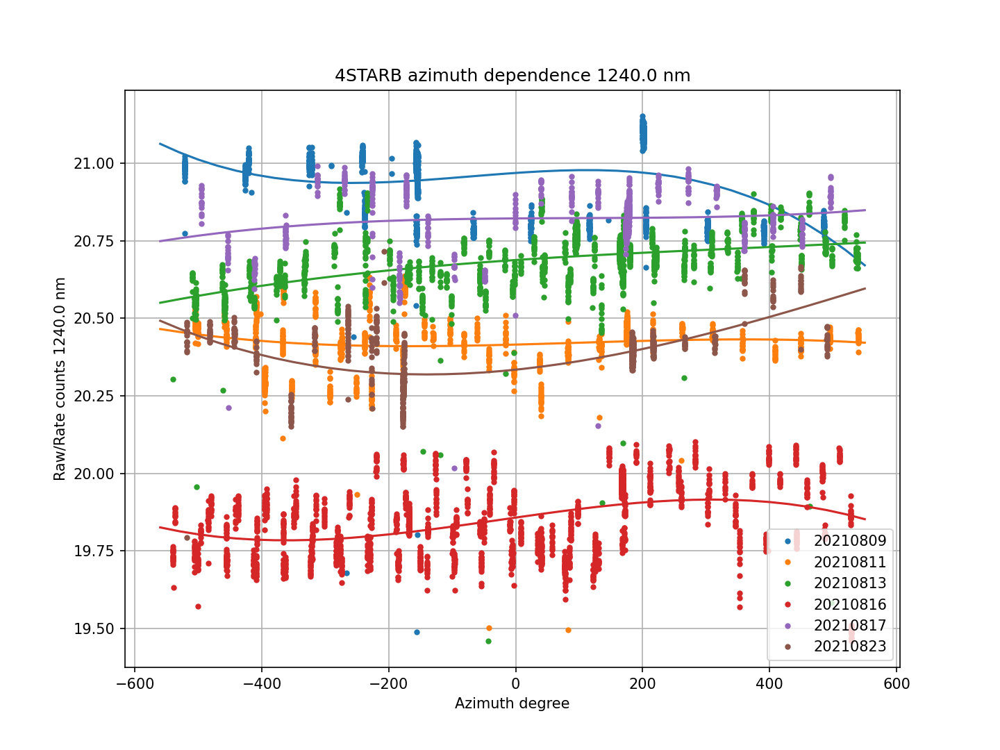

1216 1240.0


<IPython.core.display.Javascript object>


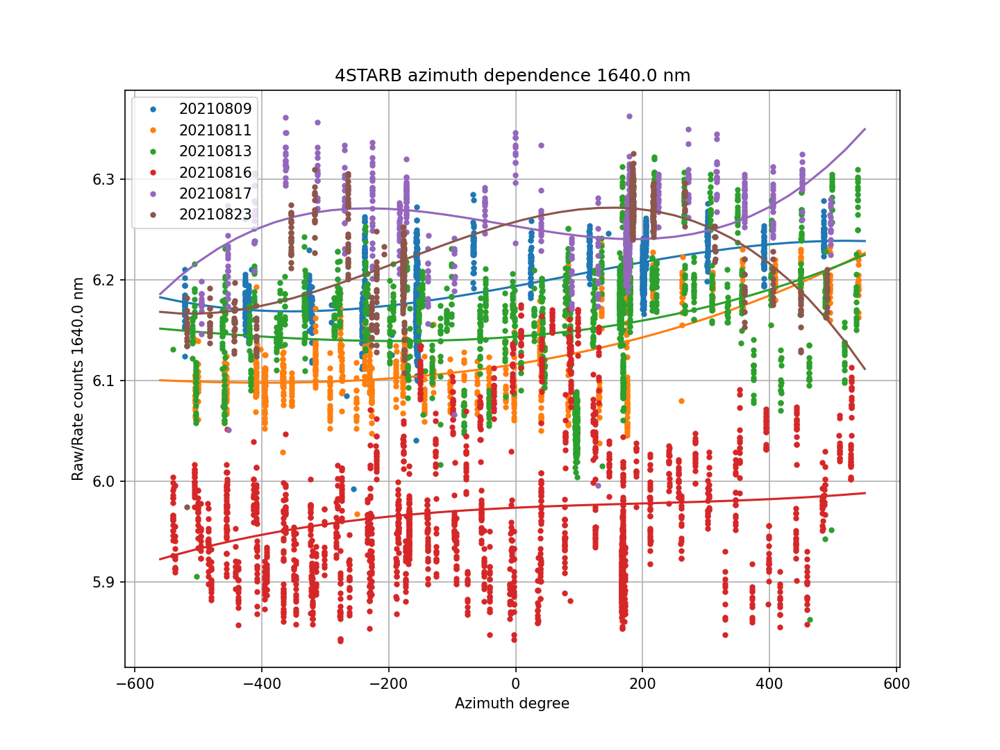

1505 1640.0


In [84]:
az = np.arange(-560,560,30)
for i,wvl in enumerate([350.0,470.0,500.0,675.0,850.0,950.0,1020.0,1240.0,1640.0]):
    plt.figure()
    iw = np.argmin(abs(wave-wvl/1000.0))
    print(iw,wvl)
    for k in days:
        flt = (dat[k]['utc']>time_lims[k][0]) & (dat[k]['utc']<time_lims[k][1]) & (np.isfinite(dat[k]['tau'][:,iw])) \
            & (dat[k]['tau'][:,iw]>aod_lims[i][0])  & (dat[k]['tau'][:,iw]<aod_lims[i][1])
        p = plt.plot(dat[k]['azi'][flt],dat[k]['rate'][flt,iw],'.',label=k)
        plt.plot(az,interp_spline(dat[k]['azi'][flt],dat[k]['rate'][flt,iw],az),'-',c=p[0].get_c())
    plt.xlabel('Azimuth degree')
    plt.ylabel('Raw/Rate counts {:3.1f} nm'.format(wvl))
    #plt.ylim(aod_lims[i])
    plt.legend(frameon=True)
    plt.title('4STARB azimuth dependence {:4.1f} nm'.format(wvl)) 
    plt.grid()
    #plt.savefig(fpo+'plots/4STARB_rate_AZIMUTH_{:04.0f}.png'.format(wvl),dpi=600,transparent=True)

## Add the binned splines

In [92]:
import scipy.stats as st
import scipy.interpolate as si

In [93]:
def calc_binspline(aod,alt,dz,su=0.0006):
    'Function that calculates the extinction coefficient profile'
    nbin = int((np.nanmax(alt)-np.nanmin(alt))/dz)
    aod_bin, dz_bin_edge, ibin = st.binned_statistic(alt,aod,bins=nbin)
    dz_bin = np.array([(dz_bin_edge[iz+1]+ddz)/2.0 for iz,ddz in enumerate(dz_bin_edge[0:-1])])
    if any(np.isfinite(aod_bin)):
        aodc_fx = si.UnivariateSpline(dz_bin[np.isfinite(aod_bin)],aod_bin[np.isfinite(aod_bin)],s=su)
        #extc_fx = aodc.derivative()
        aodc = aodc_fx(dz_bin)
    else:
        aodc = dz_bin*np.nan
    return aodc,dz_bin

<IPython.core.display.Javascript object>


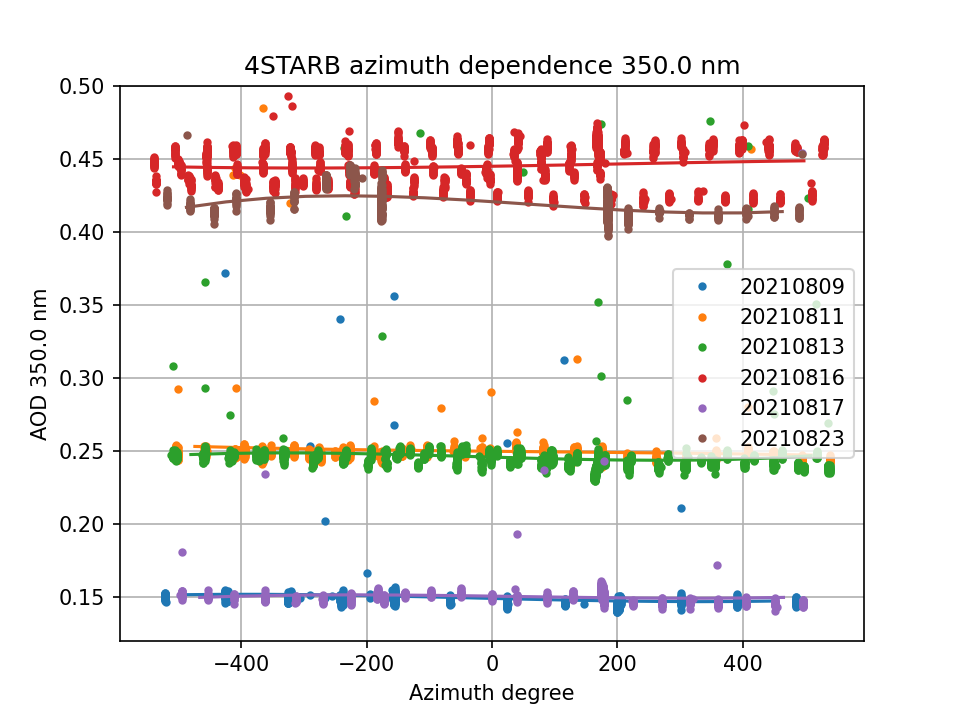

220 350.0


<IPython.core.display.Javascript object>


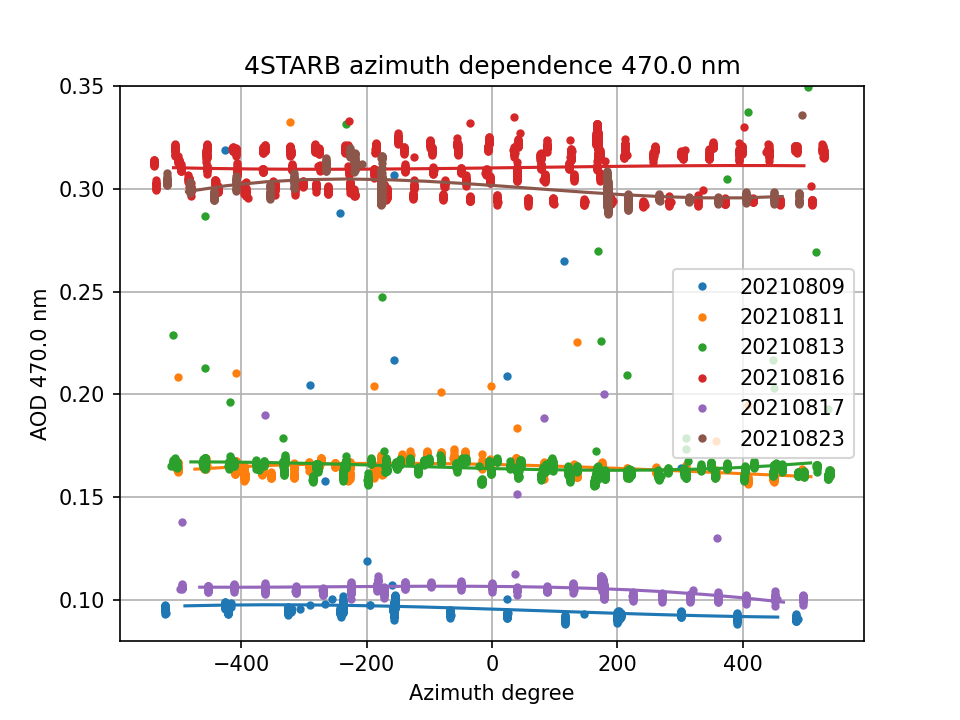

368 470.0


<IPython.core.display.Javascript object>


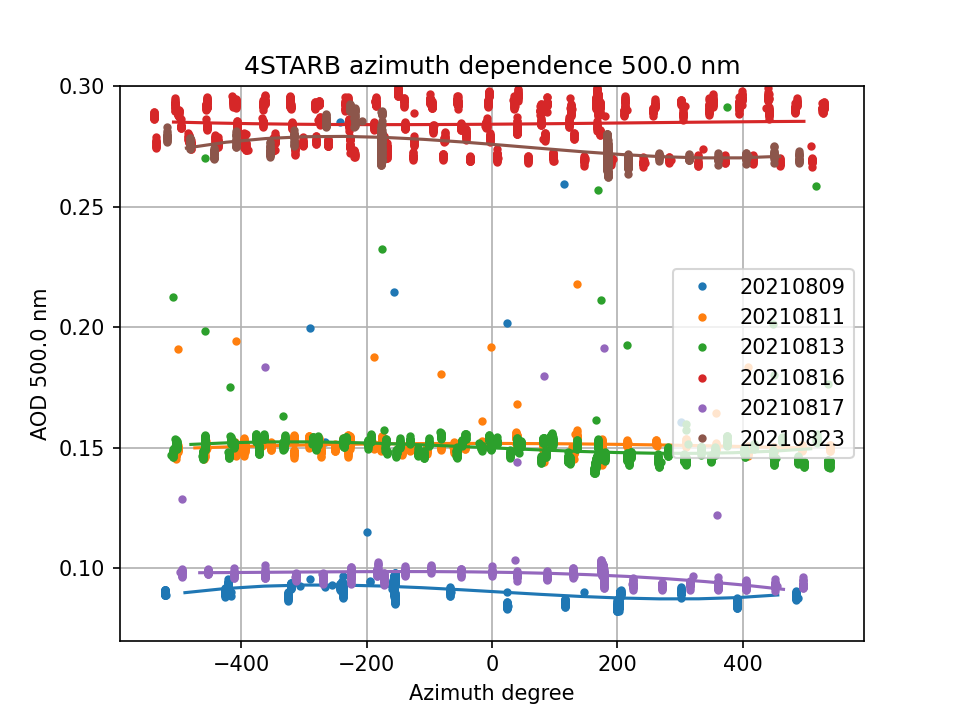

406 500.0


<IPython.core.display.Javascript object>


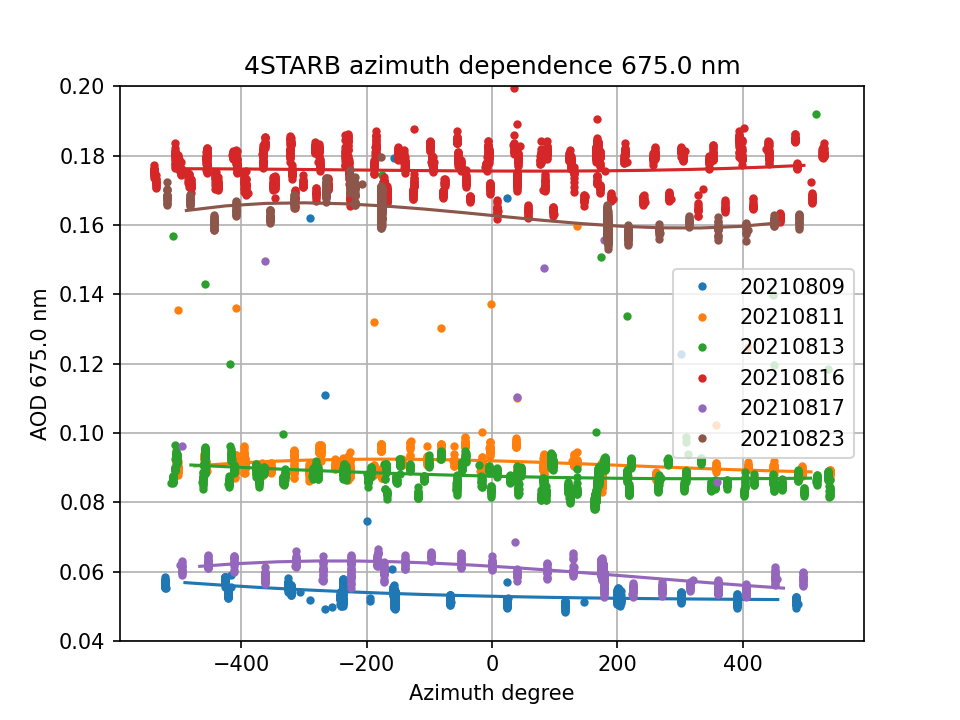

625 675.0


<IPython.core.display.Javascript object>


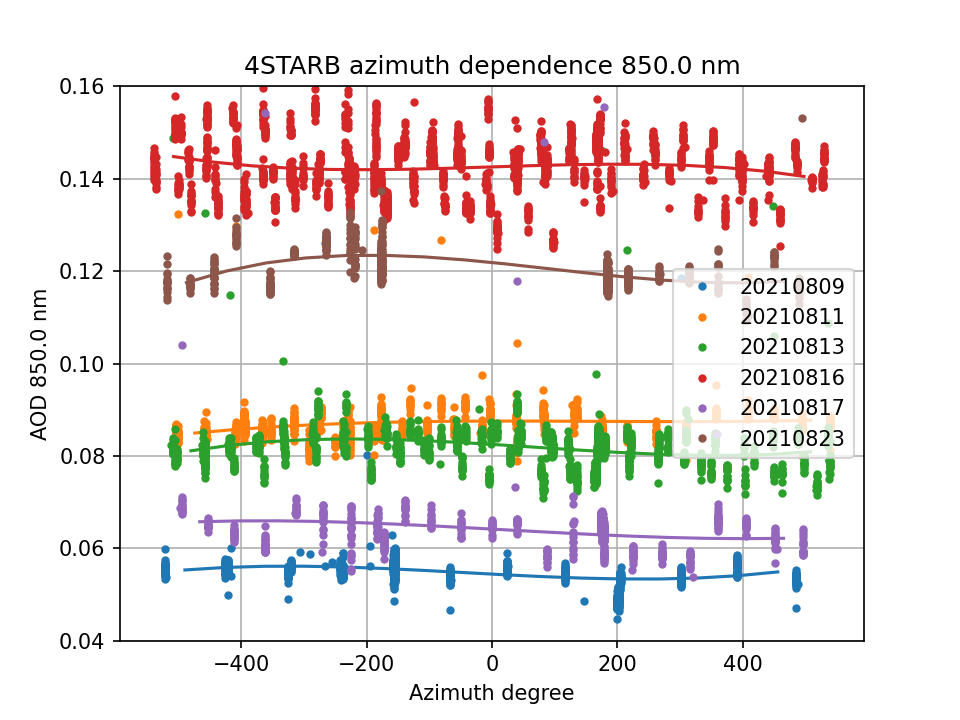

848 850.0


<IPython.core.display.Javascript object>


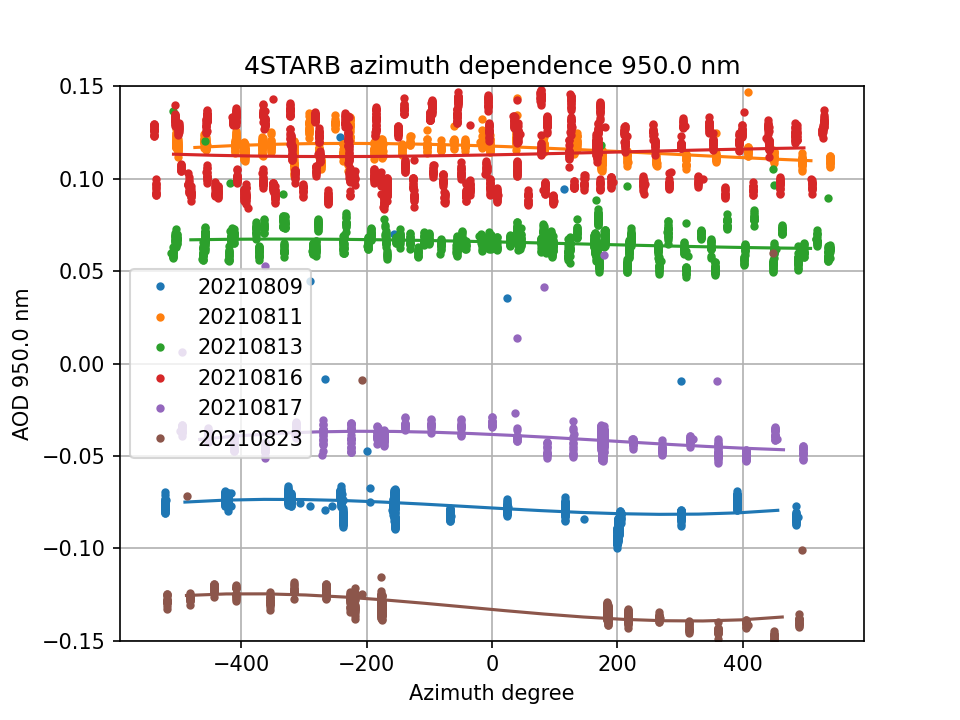

978 950.0


<IPython.core.display.Javascript object>


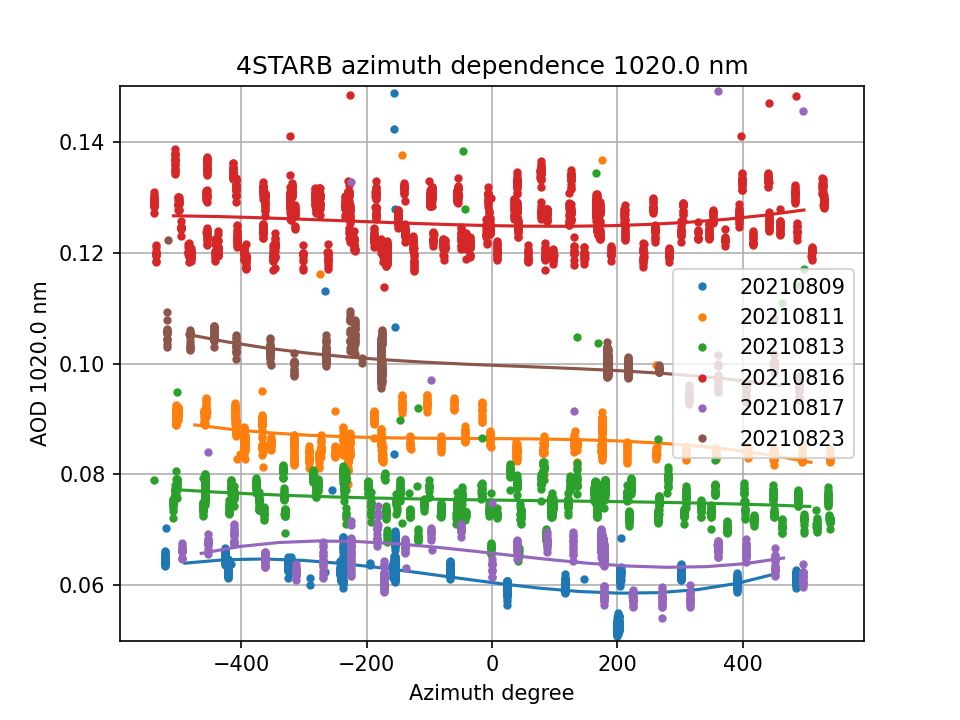

1084 1020.0


<IPython.core.display.Javascript object>


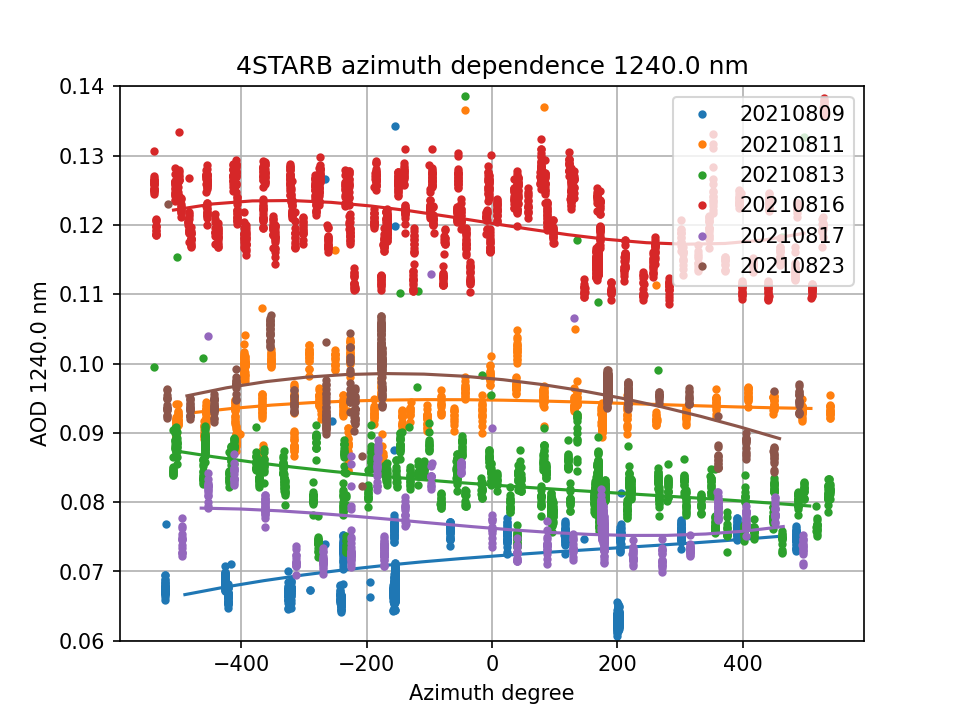

1216 1240.0


<IPython.core.display.Javascript object>


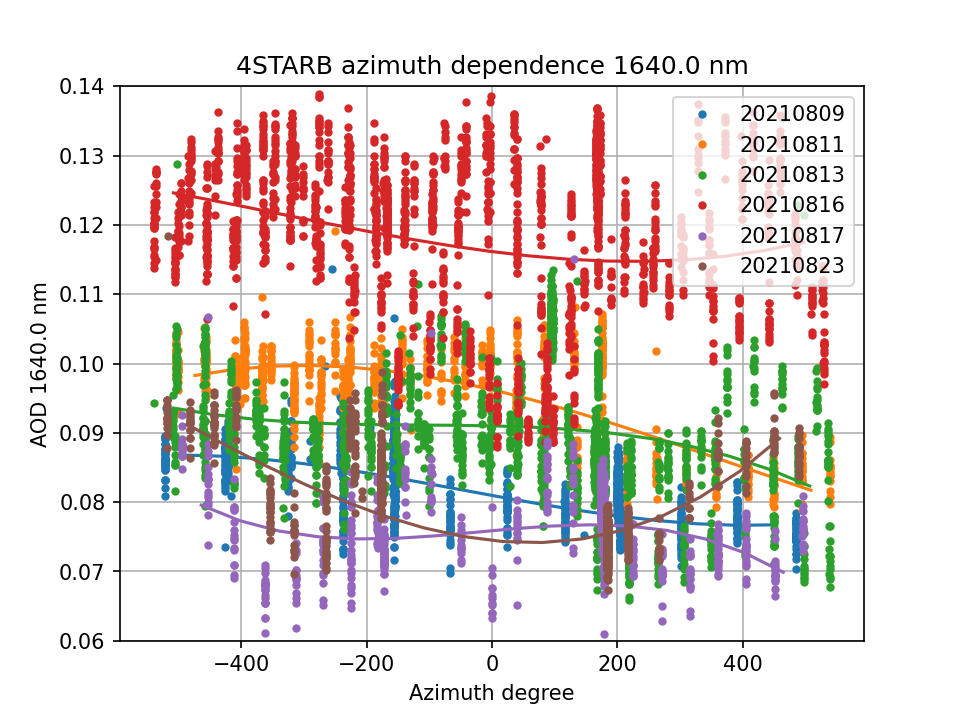

1505 1640.0


In [101]:
az = np.arange(-560,560,30)
for i,wvl in enumerate([350.0,470.0,500.0,675.0,850.0,950.0,1020.0,1240.0,1640.0]):
    plt.figure()
    iw = np.argmin(abs(wave-wvl/1000.0))
    print(iw,wvl)
    for k in days:
        flt = (dat[k]['utc']>time_lims[k][0]) & (dat[k]['utc']<time_lims[k][1]) & (np.isfinite(dat[k]['tau'][:,iw])) \
            & (dat[k]['tau'][:,iw]>aod_lims[i][0])  & (dat[k]['tau'][:,iw]<aod_lims[i][1])
        p = plt.plot(dat[k]['azi'][flt],dat[k]['tau'][flt,iw],'.',label=k)
        #plt.plot(az,interp_spline(dat[k]['azi'][flt],dat[k]['tau'][flt,iw],az),'-',c=p[0].get_c())
        spli,azbin = calc_binspline(dat[k]['tau'][flt,iw],dat[k]['azi'][flt][:,0],60.0)
        plt.plot(azbin,spli,'-',c=p[0].get_c())
    plt.xlabel('Azimuth degree')
    plt.ylabel('AOD {:3.1f} nm'.format(wvl))
    plt.ylim(aod_lims[i])
    plt.legend(frameon=True)
    plt.title('4STARB azimuth dependence {:4.1f} nm'.format(wvl)) 
    plt.grid()
    #plt.savefig(fpo+'plots/4STARB_AOD_AZIMUTH_{:04.0f}.png'.format(wvl),dpi=600,transparent=True)